# Import Packages

In [1]:
from utils import draw_results

import mne
from mne.stats import fdr_correction
from sklearn.linear_model import LogisticRegression
import numpy as np
from scipy.ndimage import gaussian_filter
from scipy import stats

import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import matplotlib
from pylab import mpl

In [2]:
plt.rcParams['font.family']=['Arial','serif', 'Times New Roman']
plt.style.use('default')
mpl.rcParams["axes.unicode_minus"] = False
%config InlineBackend.figure_format = 'svg'

# Use CUDA in MNE
mne.utils.set_config('MNE_USE_CUDA', 'true')
mne.cuda.init_cuda(verbose=True)

Now using CUDA device 0
Enabling CUDA with 10.09 GB available memory


# Define Parallel Computing Function

In [3]:
%%writefile my_parallel_fun.py

import numpy as np
from sklearn.linear_model import LogisticRegression

def calc_accs(train_X, train_y, test_X, test_y, n_ts, current_t):
    
    accs = np.zeros(n_ts)

    # X [samples, features] 
    # y [samples]
    clf = LogisticRegression(random_state=0, solver="liblinear",) .fit(train_X[:, :, current_t], train_y) # solver="liblinear", n_jobs=-1
    for test_t in range(n_ts):
        accs[test_t] = clf.score(test_X[:, :, test_t], test_y)
    
    return accs

Overwriting my_parallel_fun.py


In [4]:
import my_parallel_fun
import multiprocessing

# get num of cores in CPU
num_cores = int(multiprocessing.cpu_count())

print("CPU cores:", num_cores)

CPU cores: 32


In [5]:
def cross_model_time_decoding(train_epoch_list, test_epoch_list, ch_index):
    
    n_ts = len(train_epoch_list[0].times)

    # Training dataset [trials, 61, 2001]
    train_X = train_epoch_list[0].get_data(copy=True)[:, ch_index, :]
    train_y = [0]*train_epoch_list[0].get_data(copy=False).shape[0]
    
    for i in range(1, len(train_epoch_list)):
        
        train_X = np.concatenate((train_X, train_epoch_list[i].get_data(copy=True)[:, ch_index, :]))
        
        trials = train_epoch_list[i].get_data(copy=False).shape[0]
        train_y.extend([i]*trials)
        
    train_y = np.array(train_y)
    
    # Test Dataset
    test_X = test_epoch_list[0].get_data(copy=True)[:, ch_index, :]
    test_y = [0]*test_epoch_list[0].get_data(copy=False).shape[0]
    
    for i in range(1, len(test_epoch_list)):
        
        test_X = np.concatenate((test_X, test_epoch_list[i].get_data(copy=True)[:, ch_index, :]))
        
        trials = test_epoch_list[i].get_data(copy=False).shape[0]
        test_y.extend([i]*trials)
        
    test_y = np.array(test_y)
    
    # Normalization
    train_X = train_X - train_X.mean(axis=0, keepdims=True) #[trials, 61, 2001]
    train_X /= train_X.std(axis=0, keepdims=True)

    test_X = test_X - test_X.mean(axis=0, keepdims=True) #[trials, 61, 2001]
    test_X /= test_X.std(axis=0, keepdims=True)

    # parallel computing
    pool = multiprocessing.Pool(processes = num_cores)

    res = []
    for current_t in range(n_ts):
        r = pool.apply_async(my_parallel_fun.calc_accs, args=( train_X, train_y, test_X, test_y, n_ts, current_t )) 
        res.append(r)

    pool.close()

    accs = np.squeeze( [p.get() for p in res] ) #[n_ts, n_ts]

    return accs

# Define Group Level Cross Decoding Stats Function

In [6]:
def ctd_stats(accs, chance=0.5, corr=False):

    times = accs.shape[1]

    t_res = np.zeros((times,times))
    p_res = np.zeros((times,times))

    for t in range(times):
        data = accs[:, t, :]        
        t_res[t], p_res[t] = stats.ttest_1samp(data, chance, alternative="greater")

    if corr:
        reject_fdr, p_res = fdr_correction(p_res, alpha=0.05, method="indep")

    return p_res

# Load Data and Cross Decoding

In [ ]:
file = "../data/EEG/Subject_1_epo.fif"
epochs = mne.read_epochs(file, preload=True)

ROIs = [
    # left occipital 
    ["O1", "PO3", "PO5", "PO7", "Oz", "POz"], 
    # right occipital 
    ["O2", "PO4", "PO6", "PO8", "Oz", "POz"],
    # left temporal
    ["FT7", "T7", "TP7", "P7", "P5", "CP5"],
    # right temporal
    ["FT8", "T8", "TP8", "P8",  "P6", "CP6"],
    # parietal
    ["P1", "Pz", "P2", "CP1", "CP2", "P3", "P4", "CP3", "CP4"],
    # central
    ["Cz", "C1", "C2", "FC1", "FC2", "FCz"],    
    # frontal
    ["F1", "Fz", "F2", "AF3", "AF4", "F3", "F4"],
    # frontal pole
    ["Fp1", "Fpz", "Fp2"],    
]

ROI_names = [
    "left occipital", "rigth occipital", 
    "left temporal", "right temporal",
    "parietal",  "central", 
    "frontal", "frontal pole"
]

region_index = []
for i, names in enumerate(ROIs):
    tmp = []
    for j, ch_name in enumerate(epochs.ch_names):
        if ch_name in names:
            tmp.append(j)
    region_index.append(tmp)

In [ ]:
# cross model decoding of 2 conceptual sizes in 3 symbol types  
# 24 subjects x 24 cmd x 251 train_time_points x 251 test_time_points 
cmd_res = np.zeros((24, 24, 251, 251))  

file_path = "../data/EEG/Subject_"

for subject in range(1, 25):
    file_name = file_path + str(subject) + '_epo.fif'        
    epochs = mne.read_epochs(file_name, preload=True)
    subject -= 1

    epochs = epochs.crop(tmin=0.0, tmax=1.0)
    epochs = epochs.decimate(2);

    labels = ['pics', 'icons', 'texts', 
              'picb', 'iconb', 'textb']
    
    events_dict = { }
    for l in labels:
        events_dict[l] = []

    for id in epochs.event_id:
        # id : ab-cd-e-f-ghi
        # a : symbol type of first stimulus (1 for picture, 2 for icon, 3 for text)
        # b : conception of first stimulus (1-6 for scooter-train)
        # c : symbol type of second stimulus (1 for picture, 2 for icon, 3 for text)
        # d : conception of second stimulus (1-6 for scooter-train)
                
        for i, symbol in enumerate(['pic', 'icon', 'text']):
            if id[0] == str(i+1):
                size = 's'
                if int(id[1]) > 3:
                    size = 'b'
                events_dict[symbol+size].append(id)        

    epo_dict = { 'pic':[], 'icon':[], 'text':[] }
    for l in labels: 
        epo_dict[l[:-1]].append( epochs[events_dict[l]] )

    for i, ri in enumerate(region_index):
        cmd_res[ subject, 3*i+0, :, :] = cross_model_time_decoding( train_epoch_list=epo_dict['pic'], test_epoch_list=epo_dict['icon'], ch_index=ri )
        cmd_res[ subject, 3*i+1, :, :] = cross_model_time_decoding( train_epoch_list=epo_dict['text'], test_epoch_list=epo_dict['pic'], ch_index=ri )
        cmd_res[ subject, 3*i+2, :, :] = cross_model_time_decoding( train_epoch_list=epo_dict['icon'], test_epoch_list=epo_dict['text'], ch_index=ri )


# Left Occipital

left occipital : 

train:pic - test:icon
0.45014018096087677
0.5530586766541823


train:text - test:pic
0.44937079309335676
0.5543148917068792


train:icon - test:text
0.45681355932203394
0.5462184873949579




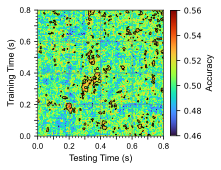

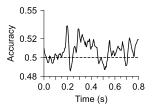

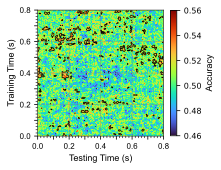

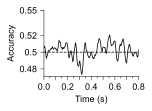

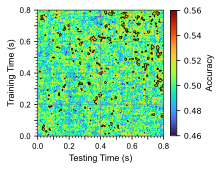

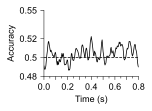

In [31]:
index = 0
print(ROI_names[index], ': \n')

for i in range(3):
    res = np.mean(cmd_res[:, index*3+i, :201, :201], axis=0)

    if i==0:
        print('train:pic - test:icon')
    elif i==1:
        print('train:text - test:pic')
    elif i==2:
        print('train:icon - test:text')

    print(np.min( res ))
    print(np.max( res ))
    print('\n')

    p = ctd_stats(cmd_res[:, index*3+i, :201, :201])
    p = gaussian_filter(p, 0.5)

    draw_results.draw_ctd_res(res=res, tmin=0.0, tmax=0.8,
                                vmin=0.46, vmax=0.56, cmap='turbo', smooth_sigma=0.0, 
                                contour=p<=0.05, contour_color='k', chance=0.5, 
                                major_tick=0.1, minor_tick=0.02,
                                vlines=[0.2, 0.4, 0.6, 0.8],
                                hlines=[0.2, 0.4, 0.6, 0.8], 
                                y_ticks=[0.48, 0.50, 0.52, 0.55])

# Right Occipital

['O2', 'PO4', 'PO6', 'PO8', 'Oz', 'POz'] : 

train:pic - test:icon
0.45454545454545453
0.550090059181748


train:text - test:pic
0.4423860453272218
0.550387847446671


train:icon - test:text
0.45608628659476114
0.5474068382635421




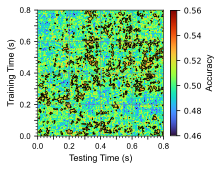

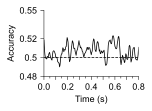

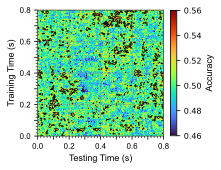

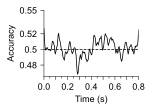

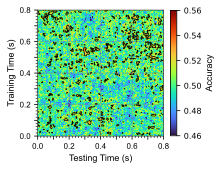

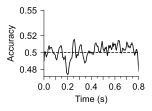

In [12]:
index = 1
print(ROIs[index], ': \n')

for i in range(3):
    res = np.mean(cmd_res[:, index*3+i, :201, :201], axis=0)

    if i==0:
        print('train:pic - test:icon')
    elif i==1:
        print('train:text - test:pic')
    elif i==2:
        print('train:icon - test:text')

    print(np.min( res ))
    print(np.max( res ))
    print('\n')

    p = ctd_stats(cmd_res[:, index*3+i, :201, :201])
    p = gaussian_filter(p, 0.3)    

    draw_results.draw_ctd_res(res=res, tmin=0.0, tmax=0.8,
                                vmin=0.46, vmax=0.56, cmap='turbo', smooth_sigma=0.0, 
                                contour=p<0.05, contour_color='k', chance=0.5, 
                                major_tick=0.1, minor_tick=0.02,
                                vlines=[0.2, 0.4, 0.6, 0.8],
                                hlines=[0.2, 0.4, 0.6, 0.8],
                                y_ticks=[0.48, 0.50, 0.52, 0.55])

# Left Temporal

['FT7', 'T7', 'TP7', 'P7', 'P5', 'CP5'] : 

train:pic - test:icon
0.4587692307692308
0.557088122605364


train:text - test:pic
0.4551516258677384
0.5501055297593922


train:icon - test:text
0.4548347778981582
0.5449889462048636




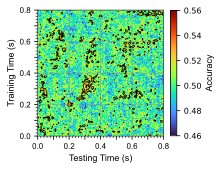

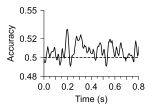

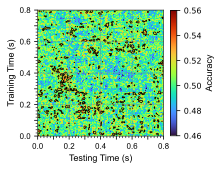

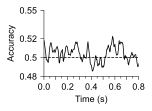

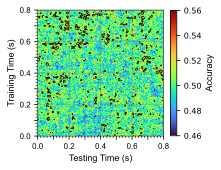

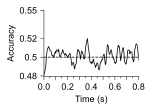

In [14]:
index = 2
print(ROIs[index], ': \n')

for i in range(3):
    res = np.mean(cmd_res[:, index*3+i, :201, :201], axis=0)

    if i==0:
        print('train:pic - test:icon')
    elif i==1:
        print('train:text - test:pic')
    elif i==2:
        print('train:icon - test:text')

    print(np.min( res ))
    print(np.max( res ))
    print('\n')

    p = ctd_stats(cmd_res[:, index*3+i, :201, :201])
    p = gaussian_filter(p, 0.4)    

    draw_results.draw_ctd_res(res=res, tmin=0.0, tmax=0.8,
                                vmin=0.46, vmax=0.56, cmap='turbo', smooth_sigma=0.0, 
                                contour=p<0.05, contour_color='k', chance=0.5, 
                                major_tick=0.1, minor_tick=0.02,
                                vlines=[0.2, 0.4, 0.6, 0.8],
                                hlines=[0.2, 0.4, 0.6, 0.8],
                                y_ticks=[0.48, 0.50, 0.52, 0.55])

# Right Temporal

['FT8', 'T8', 'TP8', 'P8', 'P6', 'CP6'] : 

train:pic - test:icon
0.46631302426126126
0.544182224888999


train:text - test:pic
0.45883179307702404
0.5435089946992073


train:icon - test:text
0.45942740472816096
0.5360909022872811




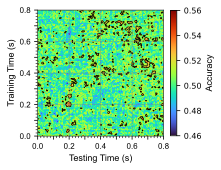

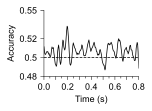

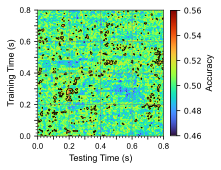

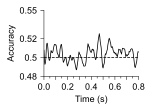

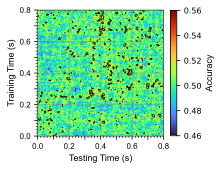

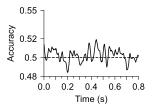

In [23]:
index = 3
print(ROIs[index], ': \n')

for i in range(3):
    res = np.mean(cmd_res[:, index*3+i, :201, :201], axis=0)

    if i==0:
        print('train:pic - test:icon')
    elif i==1:
        print('train:text - test:pic')
    elif i==2:
        print('train:icon - test:text')

    print(np.min( res ))
    print(np.max( res ))
    print('\n')

    p = ctd_stats(cmd_res[:, index*3+i, :201, :201])
    p = gaussian_filter(p, 0.45)    

    draw_results.draw_ctd_res(res=res, tmin=0.0, tmax=0.8,
                                vmin=0.46, vmax=0.56, cmap='turbo', smooth_sigma=0.0, 
                                contour=p<0.05, contour_color='k', chance=0.5, 
                                major_tick=0.1, minor_tick=0.02,
                                vlines=[0.2, 0.4, 0.6, 0.8],
                                hlines=[0.2, 0.4, 0.6, 0.8],
                                y_ticks=[0.48, 0.50, 0.52, 0.55])

# Parietal

['P1', 'Pz', 'P2', 'CP1', 'CP2', 'P3', 'P4', 'CP3', 'CP4'] : 

train:pic - test:icon
0.4594206316605956
0.5442043577762262


train:text - test:pic
0.463725994971018
0.5404387411794856


train:icon - test:text
0.46043964396395515
0.540535998955839




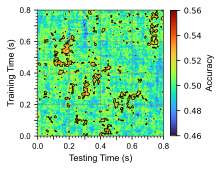

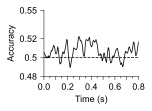

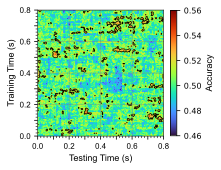

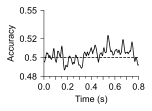

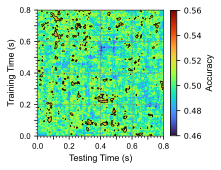

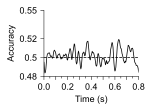

In [14]:
index = 4
print(ROIs[index], ': \n')

for i in range(3):
    res = np.mean(cmd_res[:, index*3+i, :201, :201], axis=0)

    if i==0:
        print('train:pic - test:icon')
    elif i==1:
        print('train:text - test:pic')
    elif i==2:
        print('train:icon - test:text')

    print(np.min( res ))
    print(np.max( res ))
    print('\n')

    p = ctd_stats(cmd_res[:, index*3+i, :201, :201])
    p = gaussian_filter(p, 0.45)

    draw_results.draw_ctd_res(res=res, tmin=0.0, tmax=0.8,
                                vmin=0.46, vmax=0.56, cmap='turbo', smooth_sigma=0.0, 
                                contour=p<0.05, contour_color='k', chance=0.5, 
                                major_tick=0.1, minor_tick=0.02,
                                vlines=[0.2, 0.4, 0.6, 0.8],
                                hlines=[0.2, 0.4, 0.6, 0.8],
                                y_ticks=[0.48, 0.50, 0.52, 0.55])

# Central

['Cz', 'C1', 'C2', 'FC1', 'FC2', 'FCz'] : 

train:pic - test:icon
0.4645298260292645
0.5381005308300585


train:text - test:pic
0.46764047475841614
0.5414365281368169


train:icon - test:text
0.4666675550219746
0.5356449898809198




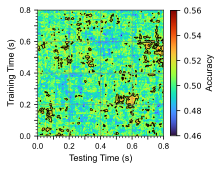

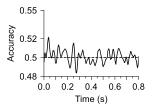

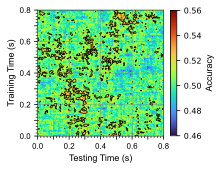

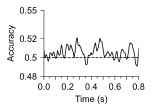

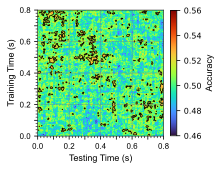

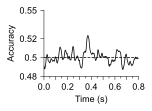

In [15]:
index = 5
print(ROIs[index], ': \n')

for i in range(3):
    res = np.mean(cmd_res[:, index*3+i, :201, :201], axis=0)

    if i==0:
        print('train:pic - test:icon')
    elif i==1:
        print('train:text - test:pic')
    elif i==2:
        print('train:icon - test:text')

    print(np.min( res ))
    print(np.max( res ))
    print('\n')

    p = ctd_stats(cmd_res[:, index*3+i, :201, :201])
    p = gaussian_filter(p, 0.4)

    draw_results.draw_ctd_res(res=res, tmin=0.0, tmax=0.8,
                                vmin=0.46, vmax=0.56, cmap='turbo', smooth_sigma=0.0, 
                                contour=p<=0.05, contour_color='k', chance=0.5, 
                                major_tick=0.1, minor_tick=0.02,
                                vlines=[0.2, 0.4, 0.6, 0.8],
                                hlines=[0.2, 0.4, 0.6, 0.8],
                                y_ticks=[0.48, 0.50, 0.52, 0.55])

# Frontal

['F1', 'Fz', 'F2', 'AF3', 'AF4', 'F3', 'F4'] : 

train:pic - test:icon
0.46819358063847266
0.5442648805776362


train:text - test:pic
0.4657622826606728
0.5374725627078738


train:icon - test:text
0.4612360816615371
0.5362589510644118




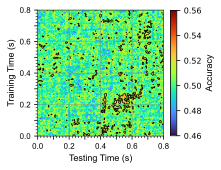

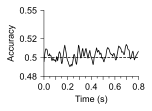

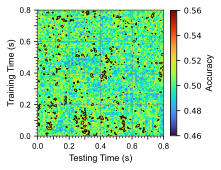

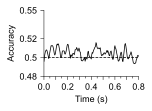

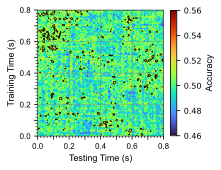

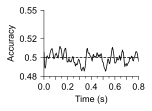

In [16]:
index = 6
print(ROIs[index], ': \n')

for i in range(3):
    res = np.mean(cmd_res[:, index*3+i, :201, :201], axis=0)

    if i==0:
        print('train:pic - test:icon')
    elif i==1:
        print('train:text - test:pic')
    elif i==2:
        print('train:icon - test:text')

    print(np.min( res ))
    print(np.max( res ))
    print('\n')

    p = ctd_stats(cmd_res[:, index*3+i, :201, :201])
    p = gaussian_filter(p, 0.45)

    draw_results.draw_ctd_res(res=res, tmin=0.0, tmax=0.8,
                                vmin=0.46, vmax=0.56, cmap='turbo', smooth_sigma=0.0, 
                                contour=p<0.05, contour_color='k', chance=0.5, 
                                major_tick=0.1, minor_tick=0.02,
                                vlines=[0.2, 0.4, 0.6, 0.8],
                                hlines=[0.2, 0.4, 0.6, 0.8],
                                y_ticks=[0.48, 0.50, 0.52, 0.55])

# Frontal Pole

['Fp1', 'Fpz', 'Fp2'] : 

train:pic - test:icon
0.4709115014463518
0.5374477411746246


train:text - test:pic
0.46277756251835206
0.5392667842529049


train:icon - test:text
0.45441551559389587
0.5396031467257217




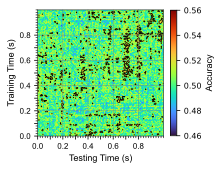

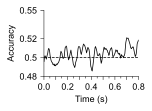

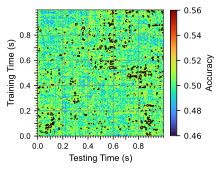

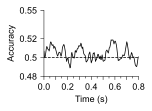

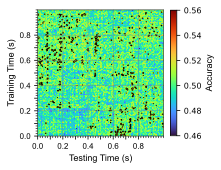

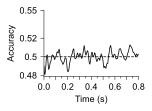

In [17]:
index = 7
print(ROIs[index], ': \n')

for i in range(3):
    res = np.mean(cmd_res[:, index*3+i, :, :], axis=0)

    if i==0:
        print('train:pic - test:icon')
    elif i==1:
        print('train:text - test:pic')
    elif i==2:
        print('train:icon - test:text')

    print(np.min( res ))
    print(np.max( res ))
    print('\n')

    p = ctd_stats(cmd_res[:, index*3+i, :, :])
    p = gaussian_filter(p, 0.5)

    draw_results.draw_ctd_res(res=res, tmin=0.0, tmax=1.0,
                                vmin=0.46, vmax=0.56, cmap='turbo', smooth_sigma=0.0, 
                                contour=p<0.05, contour_color='k', chance=0.5, 
                                major_tick=0.1, minor_tick=0.02, 
                                vlines=[0.2, 0.4, 0.6, 0.8],
                                hlines=[0.2, 0.4, 0.6, 0.8],
                                y_ticks=[0.48, 0.50, 0.52, 0.55])